In [57]:
#!pip install osmnx geopandas pandas requests descartes contextily

In [58]:
#!pip install tqdm

In [1]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')
from matplotlib.patches import PathPatch
from matplotlib.path import Path

c:\Users\Камила\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\2715854114.py:11: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [2]:
PLACE_NAME = 'Turin, Italy'
name = 'Turin'
grid_size = 500

epsg:4326
EPSG:32632


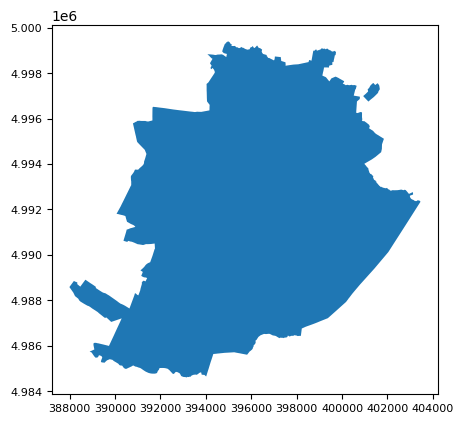

<class 'shapely.geometry.multipolygon.MultiPolygon'>


In [3]:
city = ox.geocode_to_gdf(PLACE_NAME)
print(city.crs)
# changing CRS for grid division
city = ox.project_gdf(city) 
print(city.crs)

# Plot and store the axis object
ax = city.plot()

# Customize the font size of the tick labels on the axes
ax.tick_params(axis='both', which='major', labelsize=8)

# Display the plot
plt.show()

# Print the type of geometry for your information
geometry = city['geometry'].iloc[0]
print(type(geometry))

In [4]:
import os

# the full directory path where the file should be saved
directory_path = "C:/Users/Камила/Downloads/turin/map/"

# check if the directory exists, and if not, create it
os.makedirs(directory_path, exist_ok=True)

# save the geometry file
city.to_file(f"{directory_path}{name}.shp")

## Division into grid

In [5]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=grid_size) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


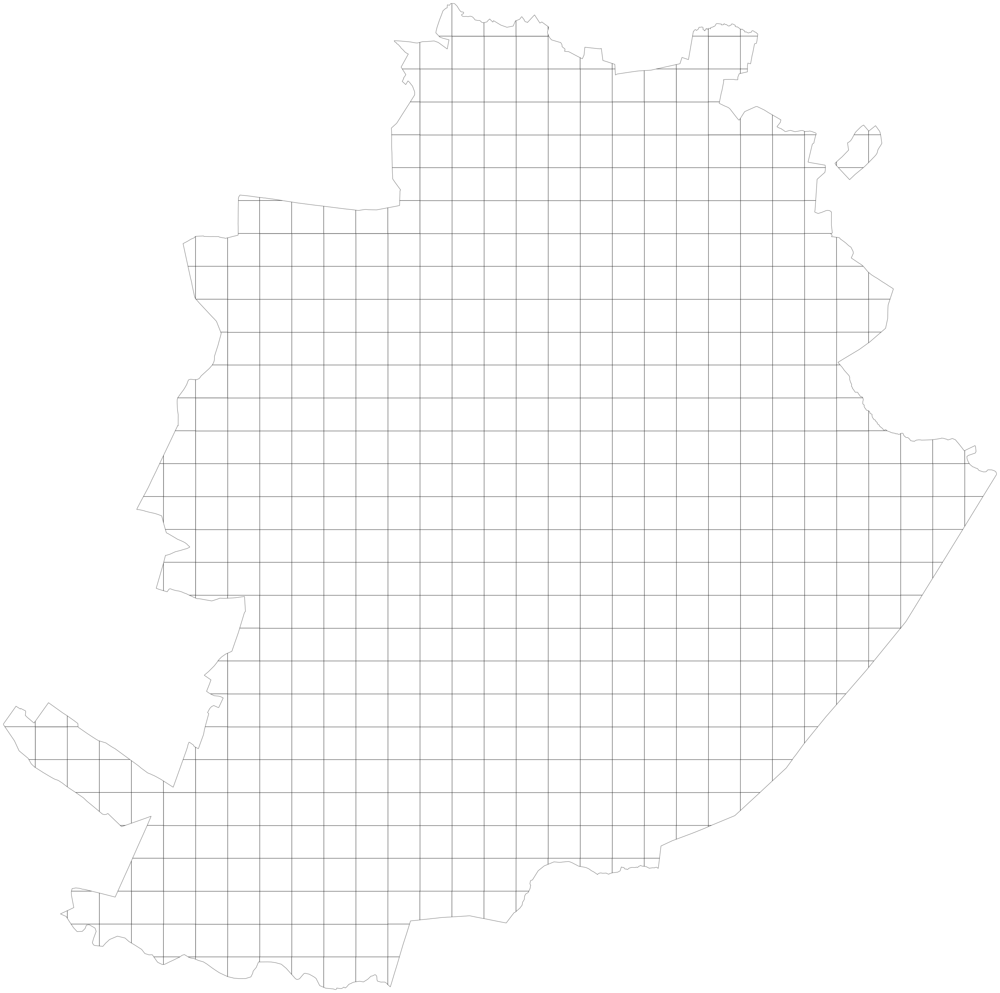

In [6]:
import shapely.geometry as sg
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = city.unary_union.bounds

# Manual patch creation
fig, ax = plt.subplots(figsize=(40, 40))
for polygon in geometry_cut.geoms:
    if isinstance(polygon, sg.Polygon) and not polygon.is_empty:
        verts = np.array(polygon.exterior.coords)
        codes = np.full(len(verts), Path.LINETO)
        codes[0] = Path.MOVETO
        codes[-1] = Path.CLOSEPOLY
        path = Path(verts, codes)
        patch = PathPatch(path, facecolor='white', edgecolor='black', alpha=0.5)
        ax.add_patch(patch)

ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [7]:
city_polyframe = gpd.GeoDataFrame(geometry=polylist)
city_polyframe.crs = city.crs
print(city_polyframe.crs)
city_polyframe.head()

EPSG:32632


,geometry
0,"POLYGON ((387993.210 4988580.714, 388192.692 4..."
1,"POLYGON ((388491.861 4988544.398, 388491.861 4..."
2,"POLYGON ((388491.861 4988051.195, 388491.861 4..."
3,"POLYGON ((388491.861 4988625.445, 388615.374 4..."
4,"POLYGON ((388990.512 4988544.398, 388990.512 4..."


(5622590.873947918, 5643622.938911469)

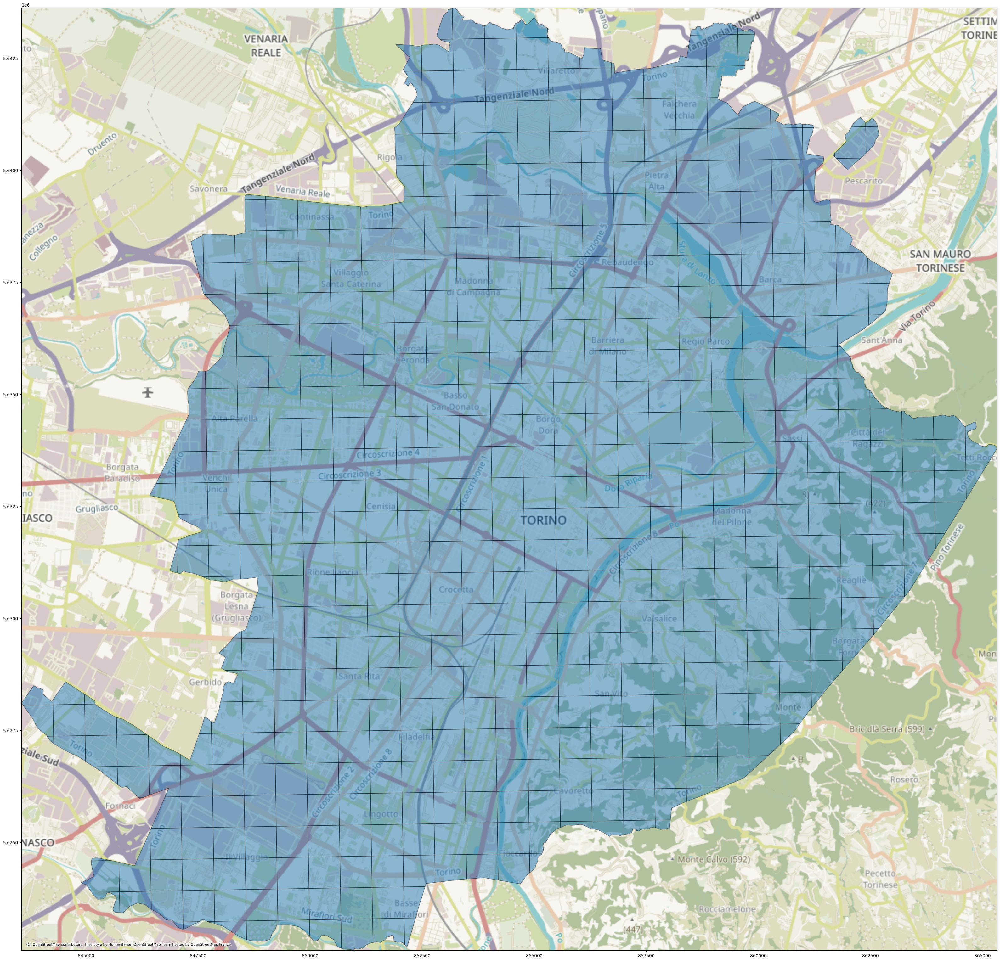

In [8]:
import contextily as ctx
# ctx uses epsg:3857ax = city.plot()
polyframe_3857 = city_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

## POI

In [9]:
city_polyframe_lat_long = ox.project_gdf(city_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
city_polyframe_lat_long.head()

,geometry
0,"POLYGON ((7.57783 45.04183, 7.58031 45.04430, ..."
1,"POLYGON ((7.58417 45.04158, 7.58428 45.03714, ..."
2,"POLYGON ((7.58428 45.03714, 7.58431 45.03608, ..."
3,"POLYGON ((7.58415 45.04231, 7.58568 45.04384, ..."
4,"POLYGON ((7.59050 45.04166, 7.59061 45.03722, ..."


## EV stations

In [10]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)

In [11]:
EV_stations.head()

amenity capacity disused:amenity operator  \
element_type osmid                                                            
node         544516332   charging_station        2     car_sharing    Evway   
             3906163545  charging_station        2     car_sharing    Evway   
             3906238205  charging_station        2     car_sharing    Evway   
             3906239156  charging_station        2     car_sharing    Evway   
             3906262432  charging_station        2     car_sharing    Evway   

                        operator:wikidata             website  \
element_type osmid                                              
node         544516332         Q127433663  https://evway.net/   
             3906163545        Q127433663  https://evway.net/   
             3906238205        Q127433663  https://evway.net/   
             3906239156        Q127433663  https://evway.net/   
             3906262432        Q127433663  https://evway.net/   

                                         geometry socket:type2  \
element_type osmid                                               
node         544516332   POINT (7.68406 45.07396)          NaN   
             3906163545  POINT (7.67168 45.07624)          NaN   
             3906238205  POINT (7.67615 45.06384)            2   
             3906239156  POINT (7.67625 45.06836)          NaN   
             3906262432  POINT (7.69354 45.06508)          NaN   

                        socket:type2:output bicycle  ... payment:debit_cards  \
element_type osmid                                   ...                       
node         544516332                  NaN     NaN  ...                 NaN   
             3906163545                 NaN     NaN  ...                 NaN   
             3906238205                22kW     NaN  ...                 NaN   
             3906239156                 NaN     NaN  ...                 NaN   
             3906262432                 NaN      no  ...                 NaN   

                        authentication:none check_date start_date maxstay  \
element_type osmid                                                          
node         544516332                  NaN        NaN        NaN     NaN   
             3906163545                 NaN        NaN        NaN     NaN   
             3906238205                 NaN        NaN        NaN     NaN   
             3906239156                 NaN        NaN        NaN     NaN   
             3906262432                 NaN        NaN        NaN     NaN   

                        payment:app payment:cash payment:membership_card  \
element_type osmid                                                         
node         544516332          NaN          NaN                     NaN   
             3906163545         NaN          NaN                     NaN   
             3906238205         NaN          NaN                     NaN   
             3906239156         NaN          NaN                     NaN   
             3906262432         NaN          NaN                     NaN   

                        payment:qr_code nodes  
element_type osmid                             
node         544516332              NaN   NaN  
             3906163545             NaN   NaN  
             3906238205             NaN   NaN  
             3906239156             NaN   NaN  
             3906262432             NaN   NaN  

[5 rows x 48 columns]

Text(0.5, 1.0, 'Turin EV stations')

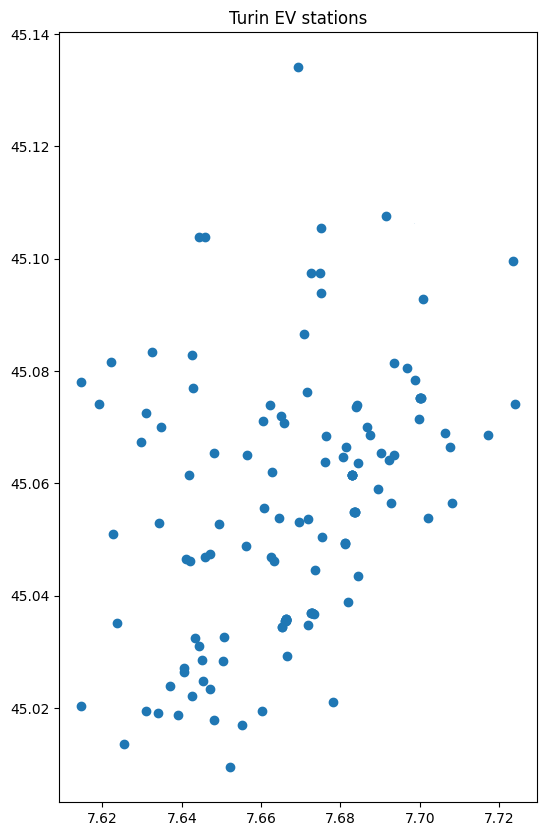

In [12]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title("Turin EV stations")

Text(0.5, 1.0, 'Turin EV stations')

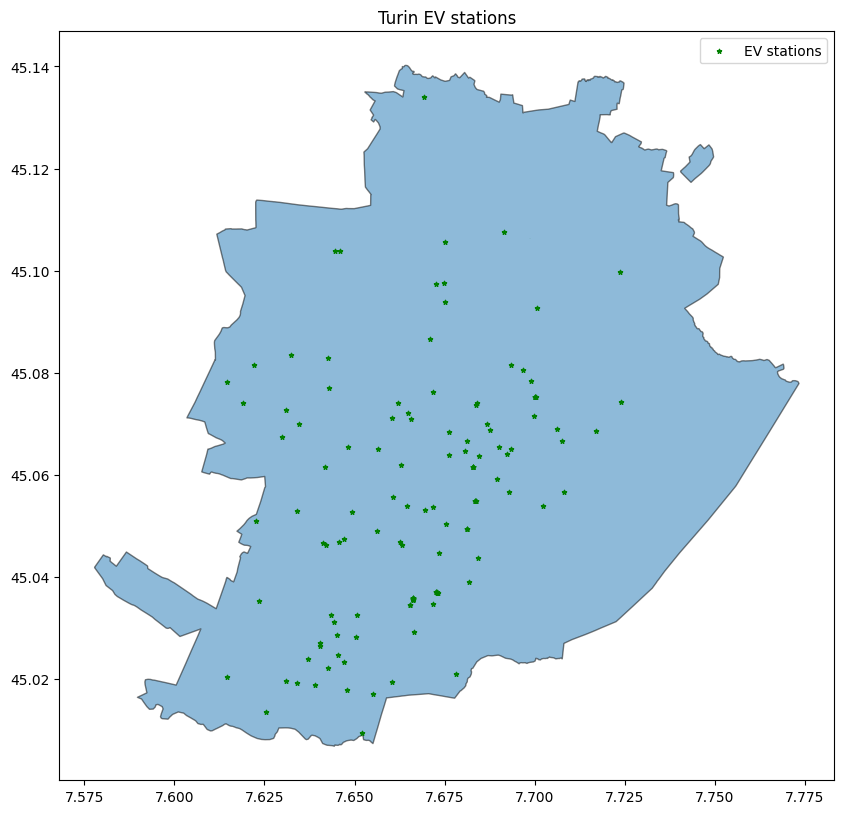

In [13]:
fig, ax = plt.subplots(figsize=(10,10))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='green', marker='*', markersize=10)
#add legend
plt.legend(['EV stations'])
plt.title("Turin EV stations")

In [14]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,city_polyframe.shape[0])):
    pip_mask = EV_stations.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\3985573752.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 609/609 [00:00<00:00, 3419.63it/s]


In [15]:
# create a new geodataframe with mask EV stations 
EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0, city_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['geometry']]], ignore_index=True)

100%|██████████| 609/609 [00:02<00:00, 242.28it/s]


In [16]:
turin_polyframe_lat_long_new = city_polyframe_lat_long.copy()
turin_polyframe_lat_long_new['EV_stations_counts'] = 0
turin_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [17]:
for i in tqdm(range(0,turin_polyframe_lat_long_new.shape[0])):
    turin_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    turin_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

100%|██████████| 609/609 [00:02<00:00, 251.92it/s]


In [18]:
#How many EV stations in each grid
turin_polyframe_lat_long_new['EV_stations_counts'].value_counts()
#Percentage of EV stations in each grid
turin_polyframe_lat_long_new['EV_stations_counts'].value_counts() / turin_polyframe_lat_long_new.shape[0]

0     0.868637
1     0.091954
2     0.027915
3     0.003284
6     0.003284
12    0.001642
7     0.001642
5     0.001642
Name: EV_stations_counts, dtype: float64

In [19]:
turin_polyframe_lat_long_new.head(5)

,geometry,EV_stations_counts,EV_stations_geomery
0,"POLYGON ((7.57783 45.04183, 7.58031 45.04430, ...",0,[]
1,"POLYGON ((7.58417 45.04158, 7.58428 45.03714, ...",0,[]
2,"POLYGON ((7.58428 45.03714, 7.58431 45.03608, ...",0,[]
3,"POLYGON ((7.58415 45.04231, 7.58568 45.04384, ...",0,[]
4,"POLYGON ((7.59050 45.04166, 7.59061 45.03722, ...",0,[]


## Population data visualize and add to each grid

Data is retrieved from : https://data.humdata.org/dataset/italy-high-resolution-population-density-maps-demographic-estimates

In [21]:
df_pop = pd.read_csv(r'C:\Users\Камила\Downloads\ita_general_2020_csv\ita_general_2020.csv')

In [22]:
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.longitude, df_pop.latitude))

In [23]:
df_pop.head()

,longitude,latitude,ita_general_2020
0,6.215694,48.000139,1.061017
1,6.216250,48.000139,1.061017
2,6.216528,48.000139,1.061017
3,6.243750,48.000139,0.831058
4,6.244028,48.000139,0.831058


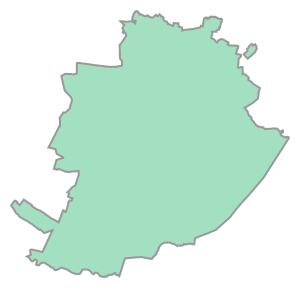

In [24]:
#extract population data for Turin
city.geometry[0]

In [25]:
# change crs to lat long
city_lat_long = ox.project_gdf(city, to_latlong=True)
pip_mask = gdf.within(city_lat_long.loc[0, 'geometry'])

In [26]:
turin_pop_gdf = gdf.loc[pip_mask]

<Axes: >

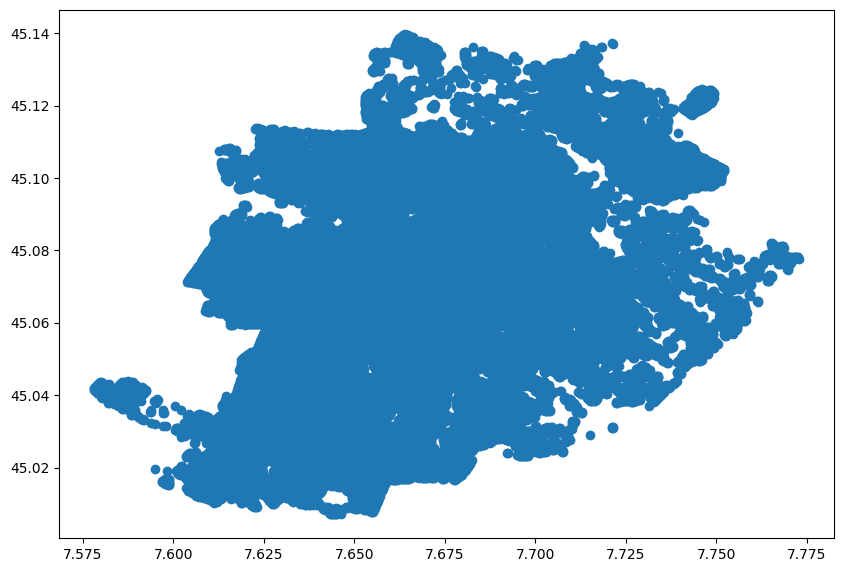

In [27]:
#plot population data with cmap
turin_pop_gdf.plot(figsize=(10,10))

In [28]:
turin_pop_gdf.to_csv(f"C:/Users/Камила/Downloads/turin/{name}-population.csv")

In [29]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = turin_pop_gdf.within(city_polyframe_lat_long.loc[i, 'geometry'])
    masks_pop.append(pip_mask)

100%|██████████| 609/609 [00:05<00:00, 119.68it/s]


In [30]:
pop_grid = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    pop_grid.append(turin_pop_gdf.loc[masks_pop[i]].ita_general_2020.mean())

In [31]:
pop_grid = np.nan_to_num(pop_grid)

In [32]:
turin_polyframe_lat_long_new['population'] = pop_grid
turin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population
0,"POLYGON ((7.57783 45.04183, 7.58031 45.04430, ...",0,[],0.022288
1,"POLYGON ((7.58417 45.04158, 7.58428 45.03714, ...",0,[],0.022693
2,"POLYGON ((7.58428 45.03714, 7.58431 45.03608, ...",0,[],0.000000
3,"POLYGON ((7.58415 45.04231, 7.58568 45.04384, ...",0,[],0.022693
4,"POLYGON ((7.59050 45.04166, 7.59061 45.03722, ...",0,[],0.022693


C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\2641130060.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['EV stations'])


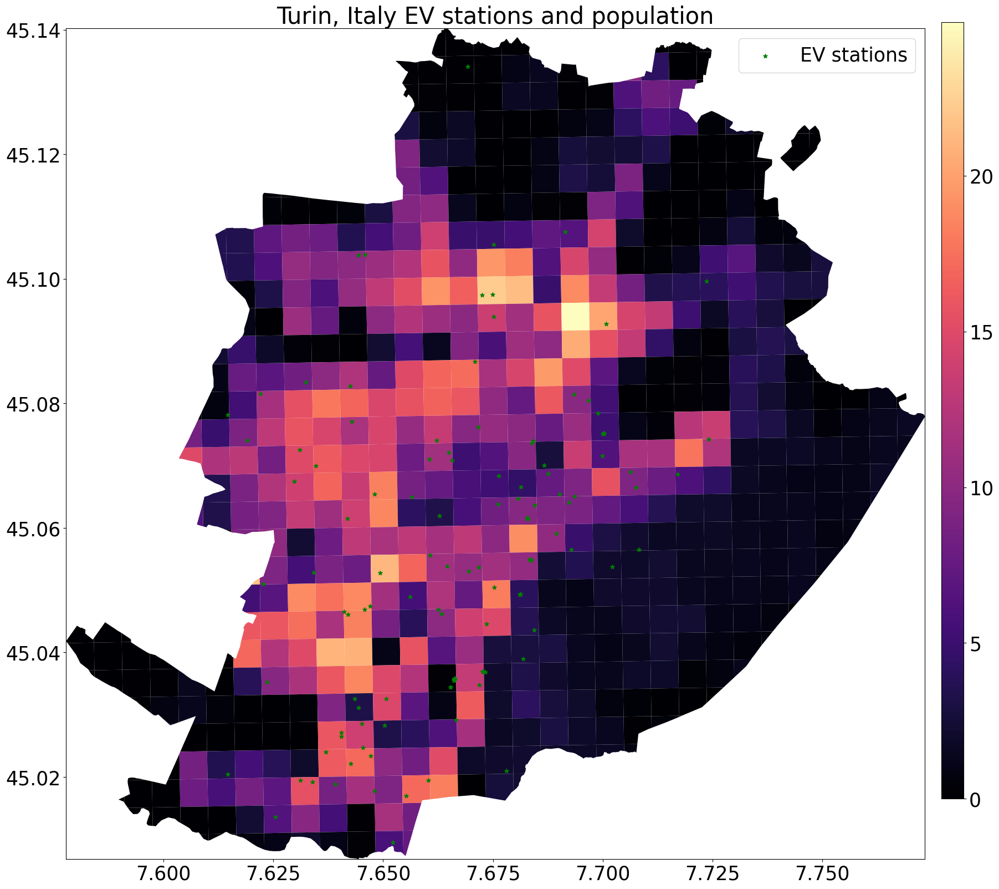

In [33]:
plt.rcParams.update({'font.size':25})
west, south, east, north = turin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
turin_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=30, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} EV stations and population')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(turin_polyframe_lat_long_new.population), vmax=max(turin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

## Land use

In [36]:
landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})

# Define the categories
categories = {
    'residential': ['residential'],
    'commercial': ['commercial', 'retail', 'office', 'industrial'],
    'retail': ['retail'],
    'industrial': ['industrial']
}

# Create a new column to categorize the landuse types
landuse['category'] = 'Other'

# Iterate through the categories and assign the corresponding landuse types
for category, tags in categories.items():
    landuse.loc[landuse['landuse'].isin(tags), 'category'] = category

C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\4238397865.py:1: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})


In [37]:
landuse.to_csv(f"C:/Users/Камила/Downloads/turin/{name}-landuse.csv")

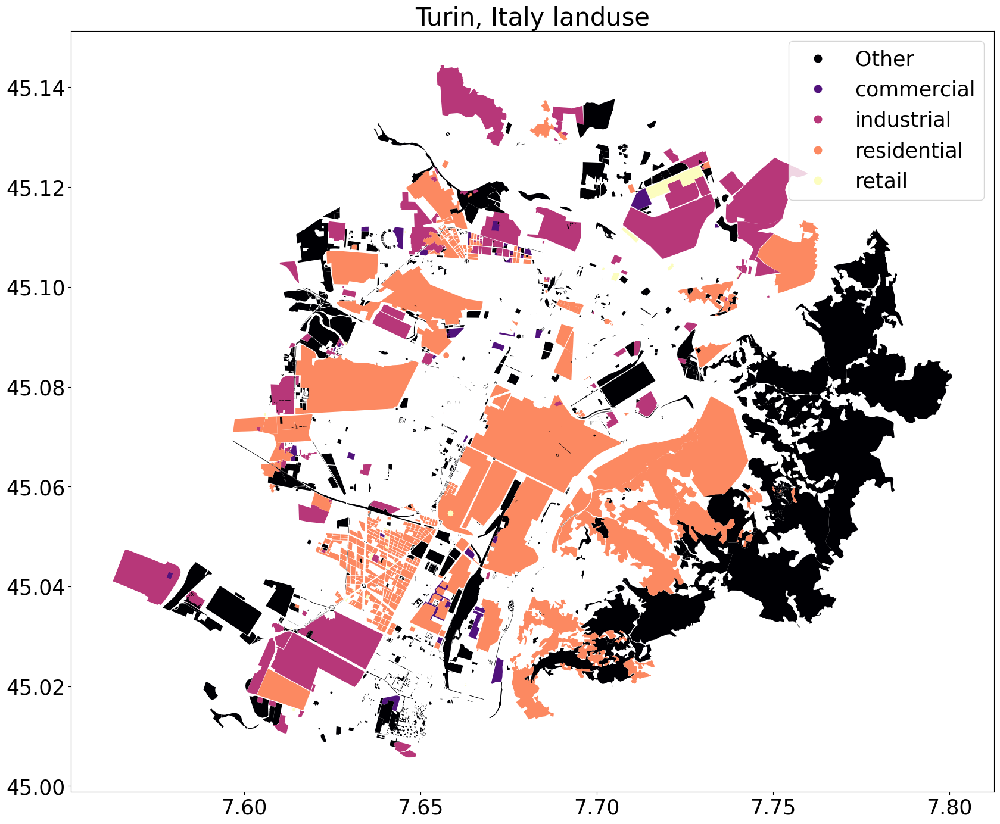

In [38]:
#plot node in landuse
fig, ax = plt.subplots(figsize=(20,20))
landuse.plot(ax=ax, column = 'category', legend=True, cmap='magma')
plt.title(f'{PLACE_NAME} landuse')
plt.show()

In [39]:
#create a copy of landuse drop everything except Category and geometry
landuse_cat = landuse[['category', 'geometry']].copy()

In [40]:
masks_land_use = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = landuse_cat.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_land_use.append(pip_mask)
    assert pip_mask.shape[0] == landuse_cat.shape[0]

100%|██████████| 609/609 [00:00<00:00, 2011.48it/s]


In [41]:
land_labels = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    if landuse_cat[masks_land_use[i]].category.value_counts().isnull().all() == True:
        land_labels.append('Other')
    else:
        land_labels.append(landuse_cat[masks_land_use[i]].category.value_counts().index[0])

In [42]:
turin_polyframe_lat_long_new['landuse'] = land_labels

In [43]:
turin_polyframe_lat_long_new.landuse.value_counts()

Other          564
residential     25
industrial      15
retail           3
commercial       2
Name: landuse, dtype: int64

C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\1746826191.py:8: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


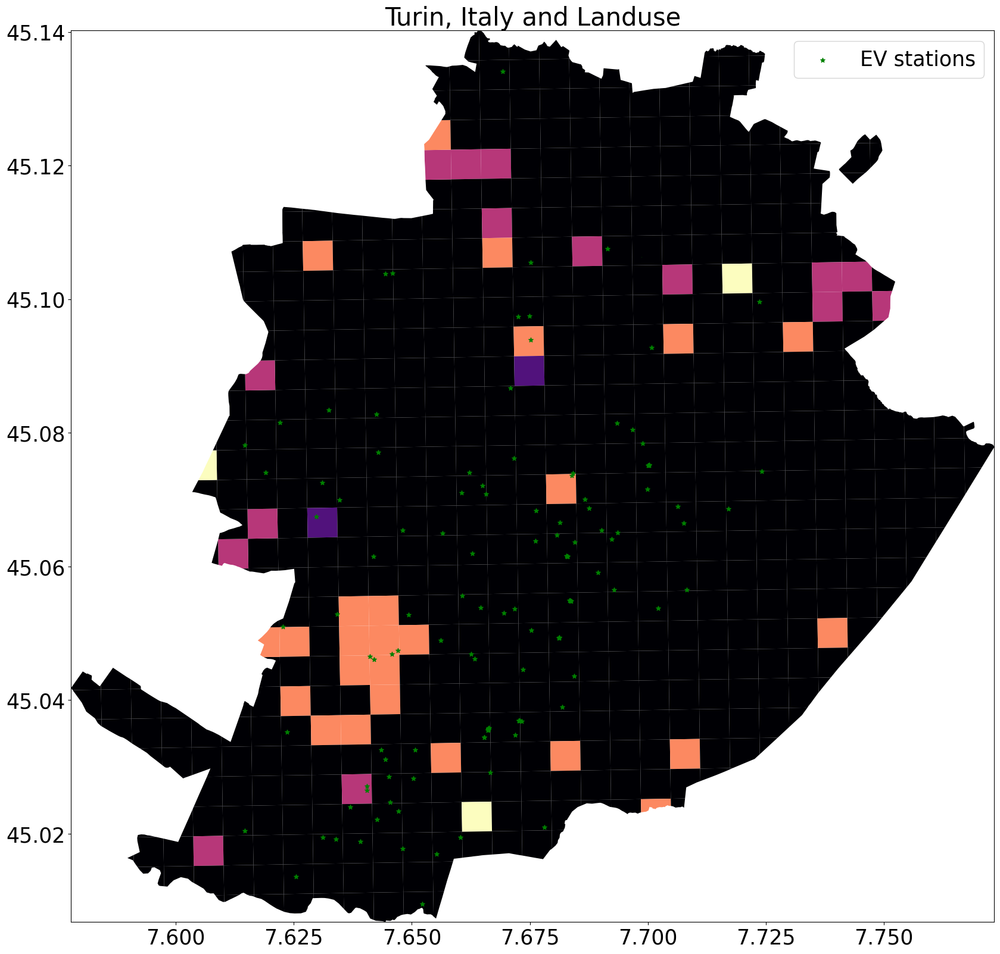

In [44]:
plt.rcParams.update({'font.size':25})
west, south, east, north = turin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
turin_polyframe_lat_long_new.plot(ax=ax, column = 'landuse', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=30, marker='*', label='EV stations')
ax.legend()
# add legend
plt.title(f'{PLACE_NAME} and Landuse')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

In [45]:
turin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population,landuse
0,"POLYGON ((7.57783 45.04183, 7.58031 45.04430, ...",0,[],0.022288,Other
1,"POLYGON ((7.58417 45.04158, 7.58428 45.03714, ...",0,[],0.022693,Other
2,"POLYGON ((7.58428 45.03714, 7.58431 45.03608, ...",0,[],0.000000,Other
3,"POLYGON ((7.58415 45.04231, 7.58568 45.04384, ...",0,[],0.022693,Other
4,"POLYGON ((7.59050 45.04166, 7.59061 45.03722, ...",0,[],0.022693,Other


## Road connectivity

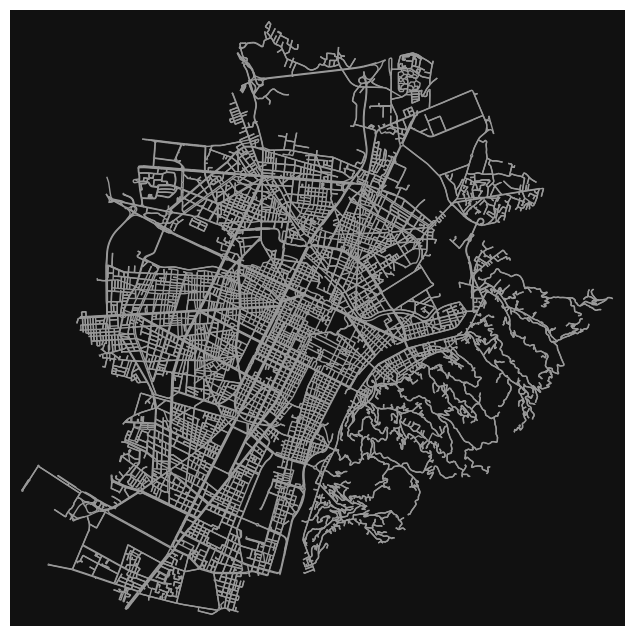

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [46]:
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G, node_size= 0)

In [47]:
area,edges = ox.graph_to_gdfs(G)

In [48]:
#calculate number of edges and nodes for each grid
nodes = []
edges = []
density = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    try: 
        poly = city_polyframe_lat_long.loc[i, 'geometry']
        G = ox.graph_from_polygon(poly, network_type='drive')
        nodes.append(len(list(G.nodes())))
        edges.append(len(list(G.edges())))
        density.append(nx.density(G))
    except:
        nodes.append(0)
        edges.append(0)
        density.append(0)

100%|██████████| 609/609 [20:32<00:00,  2.02s/it]


In [49]:
#add nodes, edges and density to the dataframe
turin_polyframe_lat_long_new['nodes'] = nodes
turin_polyframe_lat_long_new['edges'] = edges
turin_polyframe_lat_long_new['density'] = density

C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\2132186754.py:12: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


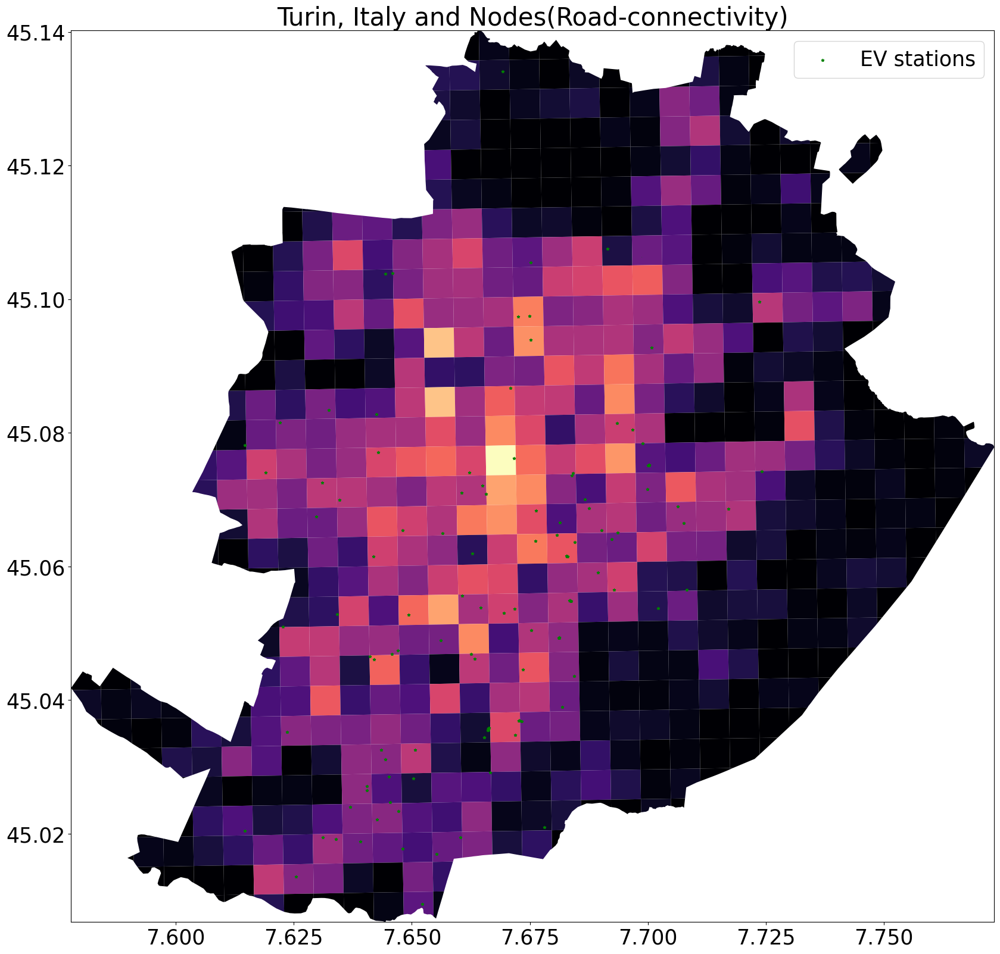

In [50]:
# relation between EVCSs and nodes
plt.rcParams.update({'font.size':25})
west, south, east, north = turin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
turin_polyframe_lat_long_new.plot(ax=ax, column = 'nodes', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Nodes(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\3602274835.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


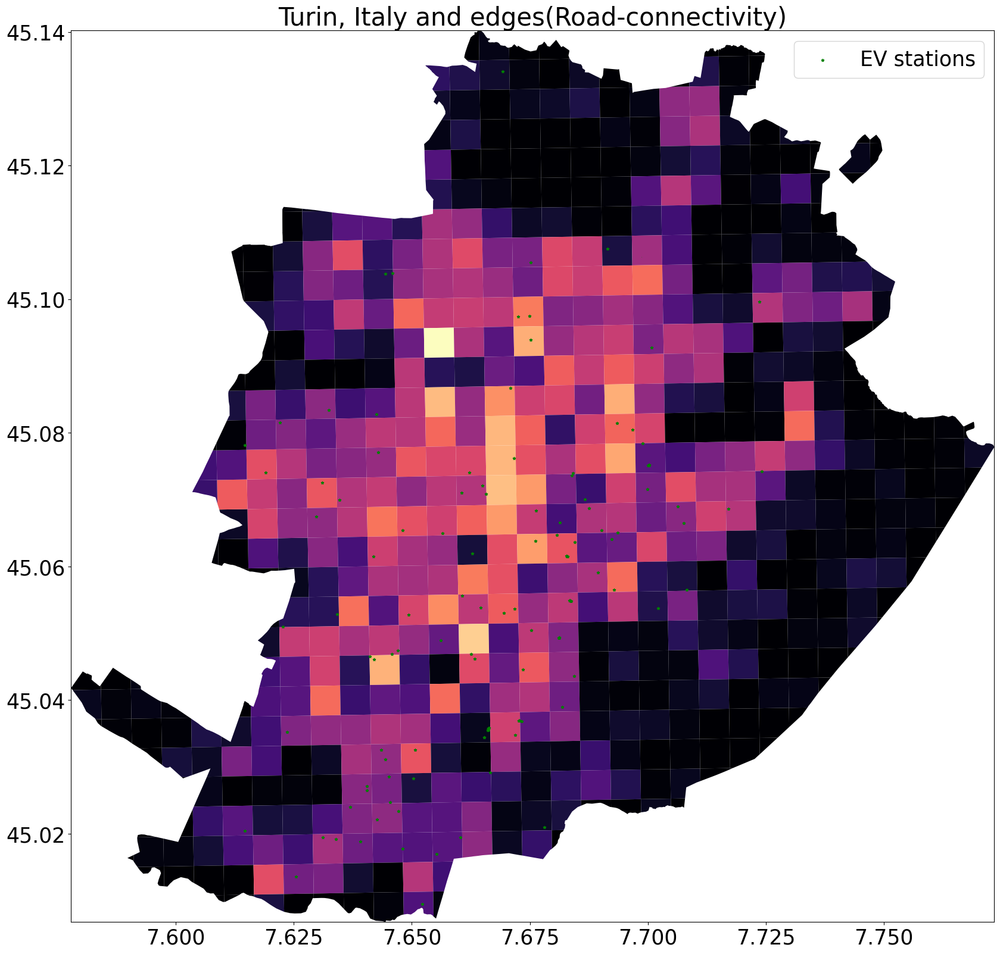

In [51]:
plt.rcParams.update({'font.size':25})
west, south, east, north = turin_polyframe_lat_long_new.unary_union.bounds

#edges
fig, ax = plt.subplots(figsize=(20,20))
turin_polyframe_lat_long_new.plot(ax=ax, column = 'edges', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and edges(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\2959788192.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


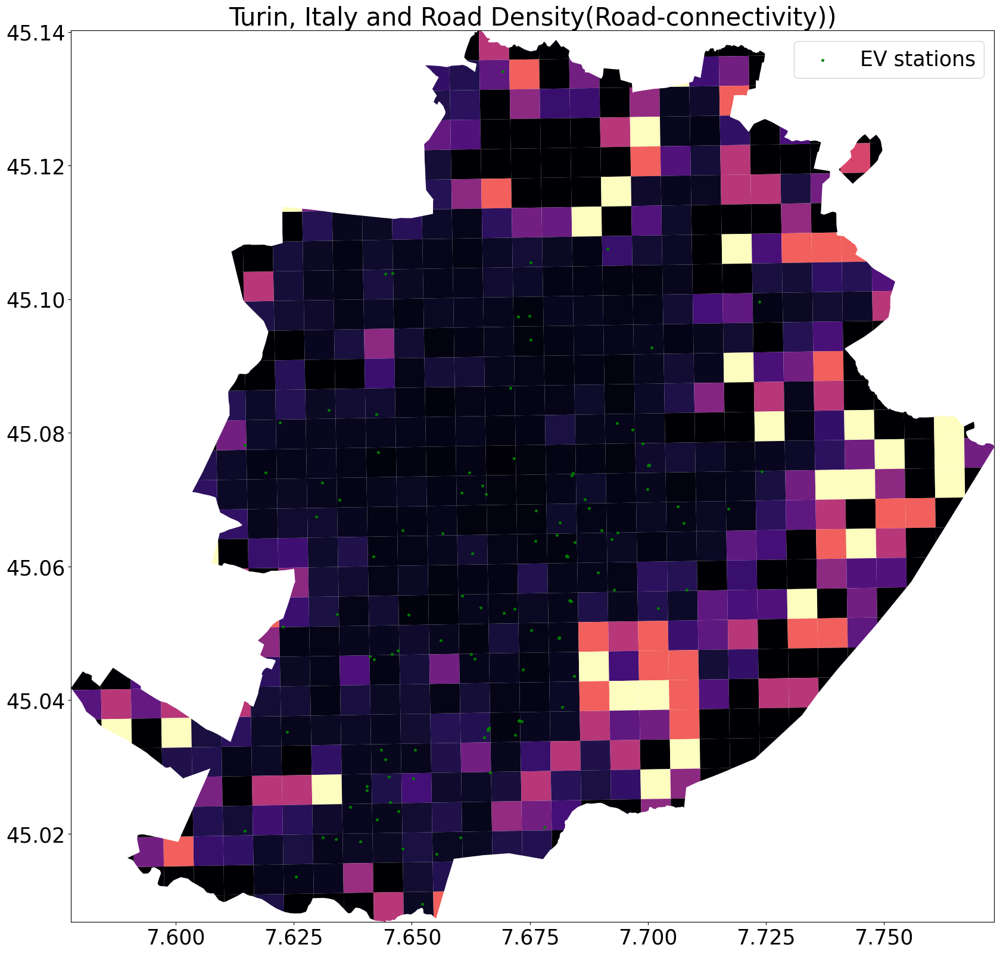

In [52]:
plt.rcParams.update({'font.size':25})
west, south, east, north = turin_polyframe_lat_long_new.unary_union.bounds

#density
fig, ax = plt.subplots(figsize=(20,20))
turin_polyframe_lat_long_new.plot(ax=ax, column = 'density', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road Density(Road-connectivity))')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

In [53]:
turin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population,landuse,nodes,edges,density
0,"POLYGON ((7.57783 45.04183, 7.58031 45.04430, ...",0,[],0.022288,Other,0,0,0.000000
1,"POLYGON ((7.58417 45.04158, 7.58428 45.03714, ...",0,[],0.022693,Other,6,8,0.266667
2,"POLYGON ((7.58428 45.03714, 7.58431 45.03608, ...",0,[],0.000000,Other,0,0,0.000000
3,"POLYGON ((7.58415 45.04231, 7.58568 45.04384, ...",0,[],0.022693,Other,0,0,0.000000
4,"POLYGON ((7.59050 45.04166, 7.59061 45.03722, ...",0,[],0.022693,Other,3,3,0.500000


## POIs

In [ ]:
import osmnx as ox
import pandas as pd
from tqdm import tqdm

def count_features_in_grids(place_name, features, city_polyframe, dataframe_name):
    for feature_key, feature_list in features.items():
        for feature in feature_list:
            try:
                # Fetch geometries from OpenStreetMap
                geometries = ox.geometries_from_place(
                    place_name,
                    {feature_key: feature}
                )
                # Export to CSV if geometries are found
                if not geometries.empty:
                    geometries.to_csv(f"C:/Users/Камила/Downloads/turin/Turin-{feature}.csv")

                    # Create masks for each grid
                    masks = []
                    for i in tqdm(range(0, city_polyframe.shape[0]), desc=f"Processing masks for {feature}"):
                        pip_mask = geometries.within(city_polyframe.loc[i, 'geometry'])
                        masks.append(pip_mask)

                    # Count features in each grid
                    feature_counts = []
                    for i in tqdm(range(0, city_polyframe.shape[0]), desc=f"Counting {feature}"):
                        feature_counts.append(geometries[masks[i]].shape[0])

                    # Add counts to the dataframe
                    dataframe_name[f'{feature}_count'] = feature_counts
                else:
                    print(f"No data found for {feature_key}='{feature}' in {place_name}.")
            except Exception as e:
                print(f"Failed to process {feature_key}='{feature}' in {place_name}: {str(e)}")

In [55]:
features = {
    'amenity': ['school', 'university', 'restaurant', 'place_of_worship', 
                'community_centre', 'townhall', 'parking', 'library'],
    'leisure': ['park', 'cinema'],
    'building': ['commercial', 'government', 'civic', 'retail']
}

city_polyframe = turin_polyframe_lat_long_new

count_features_in_grids(PLACE_NAME, features, city_polyframe, turin_polyframe_lat_long_new)

C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\411881801.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(
Counting school: 100%|██████████| 609/609 [00:00<00:00, 664.44it/s]
C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\411881801.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(
Counting university: 100%|

Failed to process leisure='cinema' in Turin, Italy: No data elements in server response. Check log and query location/tags.


C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\411881801.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(
Counting commercial: 100%|██████████| 609/609 [00:00<00:00, 649.66it/s]
C:\Users\Камила\AppData\Local\Temp\ipykernel_6976\411881801.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  geometries = ox.geometries_from_place(
Counting government: 1

In [56]:
turin_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,"POLYGON ((7.577834800000002 45.0418278, 7.5803...",POLYGON ((7.5841723605139055 45.04157964534934...,POLYGON ((7.584281837478157 45.037141257626914...,POLYGON ((7.584154367831215 45.042309001336484...,"POLYGON ((7.590501848816324 45.04165795249562,..."
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.022288,0.022693,0.0,0.022693,0.022693
landuse,Other,Other,Other,Other,Other
nodes,0,6,0,0,3
edges,0,8,0,0,3
density,0.0,0.266667,0.0,0.0,0.5
school_count,0,0,0,0,0
university_count,0,0,0,0,0


## Traffic

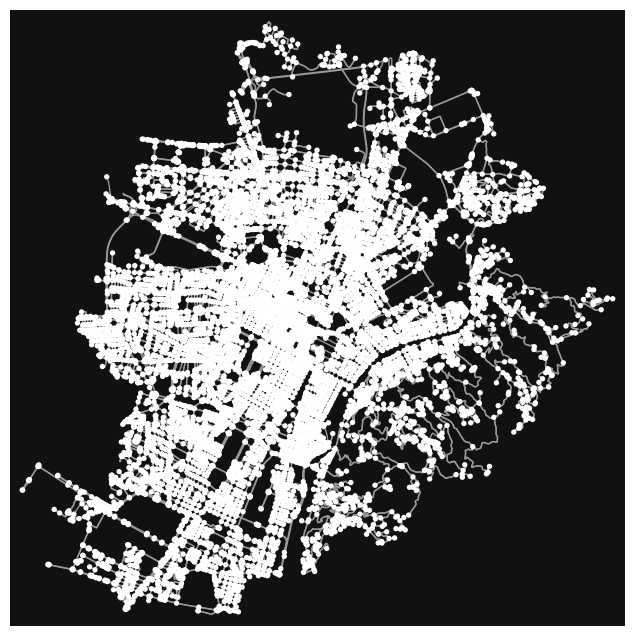

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [57]:
# Fetch road network data
turin_graph = ox.graph_from_place(PLACE_NAME, network_type='drive')

# Visualize the road network
ox.plot_graph(turin_graph)

In [58]:
# Convert the graph to edge GeoDataFrame
edges = ox.graph_to_gdfs(turin_graph, nodes=False, edges=True)

In [59]:
selected_columns = edges[['osmid', 'oneway', 'lanes', 'highway', 'maxspeed', 
                          'geometry']]

In [60]:
selected_columns.head()

osmid  oneway lanes  \
u        v           key                                                       
13924308 945268794   0                                61293337    True   NaN   
         1625774856  0                               133270821    True     3   
13924314 12124797861 0                                37761143    True     1   
         939124389   0    [1124978107, 1124978109, 1124978094]   False     4   
         11935377862 0    [1306973976, 1286868265, 1271379018]   False     4   

                            highway maxspeed  \
u        v           key                       
13924308 945268794   0     tertiary      NaN   
         1625774856  0      primary      NaN   
13924314 12124797861 0     tertiary       50   
         939124389   0    secondary      NaN   
         11935377862 0    secondary      NaN   

                                                                   geometry  
u        v           key                                                     
13924308 945268794   0      LINESTRING (7.66952 45.07765, 7.66954 45.07773)  
         1625774856  0      LINESTRING (7.66952 45.07765, 7.66920 45.07764)  
13924314 12124797861 0      LINESTRING (7.69074 45.08784, 7.69071 45.08779)  
         939124389   0    LINESTRING (7.69074 45.08784, 7.69078 45.08782...  
         11935377862 0    LINESTRING (7.69074 45.08784, 7.69064 45.08789...

In [61]:
# Drop rows where any cell in that row is NA
selected_columns = selected_columns.dropna()

In [62]:
# Convert road network to a projected CRS
road_network = selected_columns.to_crs(epsg=32633)

# Also ensure your polygons are in the same CRS
turin_polyframe_lat_long_new = turin_polyframe_lat_long_new.to_crs(epsg=32633)

In [63]:
# Calculate centroids safely
road_centers = road_network.centroid

In [64]:
def check_one_way(polygon, roads):
    # Recalculate centroids here if necessary
    road_centers = roads.centroid  # Ensure 'roads' is already in a projected CRS
    within_mask = road_centers.within(polygon)
    one_way_roads = roads[within_mask & roads['oneway']]
    return 'Yes' if not one_way_roads.empty else 'No'

# Apply the function
turin_polyframe_lat_long_new['oneway_exists'] = turin_polyframe_lat_long_new['geometry'].apply(check_one_way, roads=road_network)

In [65]:
turin_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,POLYGON ((-84550.54506561765 5014464.283822774...,"POLYGON ((-84053.9678526012 5014390.726483936,...","POLYGON ((-84090.75461534446 5013896.89669393,...",POLYGON ((-84047.92244785605 5014471.877052397...,POLYGON ((-83554.68462825438 5014353.532177904...
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.022288,0.022693,0.0,0.022693,0.022693
landuse,Other,Other,Other,Other,Other
nodes,0,6,0,0,3
edges,0,8,0,0,3
density,0.0,0.266667,0.0,0.0,0.5
school_count,0,0,0,0,0
university_count,0,0,0,0,0


In [66]:
def check_highways(polygon, roads):
    # Calculate centroids for the roads and check if they fall within the given polygon
    road_centers = roads.centroid
    within_mask = road_centers.within(polygon)
    highways_within = roads.loc[within_mask, 'highway']

    # Flatten the list of highways if they are stored in lists within cells
    flattened_highways = []
    for item in highways_within.dropna():
        if isinstance(item, list):
            flattened_highways.extend(item)  # Extend the flat list with elements of the sublist
        else:
            flattened_highways.append(item)  # Append the item directly if it's not a list

    # Create a set of unique highway types, removing duplicates and handling unhashable types
    unique_highways = set(flattened_highways)
    return unique_highways if unique_highways else 'None'

In [67]:
turin_polyframe_lat_long_new['highway_types'] = turin_polyframe_lat_long_new['geometry'].apply(check_highways, roads=road_network)

In [68]:
turin_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,POLYGON ((-84550.54506561765 5014464.283822774...,"POLYGON ((-84053.9678526012 5014390.726483936,...","POLYGON ((-84090.75461534446 5013896.89669393,...",POLYGON ((-84047.92244785605 5014471.877052397...,POLYGON ((-83554.68462825438 5014353.532177904...
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.022288,0.022693,0.0,0.022693,0.022693
landuse,Other,Other,Other,Other,Other
nodes,0,6,0,0,3
edges,0,8,0,0,3
density,0.0,0.266667,0.0,0.0,0.5
school_count,0,0,0,0,0
university_count,0,0,0,0,0


In [69]:
def aggregate_lanes(polygon, roads):
    road_centers = roads.centroid
    within_mask = road_centers.within(polygon)
    lanes_within = roads.loc[within_mask, 'lanes'].dropna()
    # Convert data to numeric, because 'lanes' might be stored as strings
    lanes_within = pd.to_numeric(lanes_within, errors='coerce')
    return lanes_within.mean()  # You could also consider sum, max, or other aggregations

In [70]:
turin_polyframe_lat_long_new['average_lanes'] = turin_polyframe_lat_long_new['geometry'].apply(aggregate_lanes, roads=road_network)

In [71]:
def aggregate_maxspeed(polygon, roads):
    road_centers = roads.centroid
    within_mask = road_centers.within(polygon)
    maxspeed_within = roads.loc[within_mask, 'maxspeed'].dropna()
    
    # Process each maxspeed entry, whether list or string, to get numeric values
    def process_maxspeed_entry(entry):
        if isinstance(entry, list):
            # Assuming the list has a string with the first element as the speed
            return pd.to_numeric(entry[0].split(' ')[0], errors='coerce')
        elif isinstance(entry, str):
            return pd.to_numeric(entry.split(' ')[0], errors='coerce')
        else:
            return pd.NA  # Pandas' NA for missing type-aware handling

    # Apply processing function to each item in the series
    maxspeed_numeric = maxspeed_within.apply(process_maxspeed_entry)
    return maxspeed_numeric.mean()  # Calculate mean of the cleaned, numeric maxspeed values

In [72]:
turin_polyframe_lat_long_new['average_maxspeed'] = turin_polyframe_lat_long_new['geometry'].apply(aggregate_maxspeed, roads=road_network)

In [75]:
turin_polyframe_lat_long_new['city'] = 'Turin'

In [76]:
turin_polyframe_lat_long_new.head().T

,0,1,2,3,4
geometry,POLYGON ((-84550.54506561765 5014464.283822774...,"POLYGON ((-84053.9678526012 5014390.726483936,...","POLYGON ((-84090.75461534446 5013896.89669393,...",POLYGON ((-84047.92244785605 5014471.877052397...,POLYGON ((-83554.68462825438 5014353.532177904...
EV_stations_counts,0,0,0,0,0
EV_stations_geomery,[],[],[],[],[]
population,0.022288,0.022693,0.0,0.022693,0.022693
landuse,Other,Other,Other,Other,Other
nodes,0,6,0,0,3
edges,0,8,0,0,3
density,0.0,0.266667,0.0,0.0,0.5
school_count,0,0,0,0,0
university_count,0,0,0,0,0


In [77]:
# Save the updated DataFrame to a CSV file
turin_polyframe_lat_long_new.to_csv(r"C:\Users\Камила\BIG_DATA_PROJECT\charging_stations\task_2\turin.csv", index=False)